# See some crossings over V1/V2 border

In [2]:
%matplotlib widget
import h5py
import numpy as np
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patches as patch
import scipy.ndimage as img
import scipy.signal as signal 
import scipy.stats as stat
from alphashape import alphashape
from shapely.geometry import Polygon

In [3]:
import sys
import os
functions_folder = os.path.abspath('/media/mathis/Data/Mathis/Functions')
if functions_folder not in sys.path:
    sys.path.append(functions_folder)
from Detection_functions import MCDA, circular_mask, preprocessing

In [4]:
condition='anesthesia' #between anesthesia and awake
session='evokedU' #between evokedU, evokedD and spontaneous

In [5]:
original_data_directory=r'/media/mathis/Data/Mathis/Original Data/'

In [6]:
if condition=='awake':
    fs = 100 #Hz
    pixel_spacing = 0.0566 #mm
    if session=='evoked':
        bks_evoked_path = original_data_directory+'gaussian_pos4_ziggy_210908.npy'
        Data = np.load(bks_evoked_path)
    elif session=='spontaneous':
        bks_blank_path = original_data_directory+'blank_ziggy_210908.npy'
        Data = np.load(bks_blank_path)
    mean = np.nanmean(Data)
    nan_loc = np.isnan(Data)
    Data[nan_loc] = mean
    N_trials, Nt, Nx, Ny = Data.shape
    mask = circular_mask((Nx,Ny), center=(220,190), radius=180) #160 should be more relevant

if condition=='anesthesia':
    fs=110 #Hz
    pixel_spacing = 0.0575 #mm
    if session=='evokedD':
        anesth_evokedD_path = original_data_directory+'signal_240306_gaussianD.mat'
        file_anesth_evokedD = h5py.File(anesth_evokedD_path)['signal']
        Data = np.array(file_anesth_evokedD)
    elif session=='evokedU':
        anesth_evokedU_path = original_data_directory+'signal_240306_gaussianU.mat'
        file_anesth_evokedU = h5py.File(anesth_evokedU_path)['signal']
        Data = np.array(file_anesth_evokedU)
    elif session=='spontaneous':
        anesth_blank_path = original_data_directory+'signal_240306_blank.mat' #change it to adapt to your directories
        file_anesth_blank = h5py.File(anesth_blank_path)['signal']
        Data = np.array(file_anesth_blank)
    N_trials, Nt, Nx, Ny = Data.shape
    mask = circular_mask((Nx,Ny), center=(115,125), radius=135) #155 should be more relevant,

## Parameters and trial choices

In [7]:
trial_number=0
test_trial=Data[trial_number]
preprocessed_trial = preprocessing(trial=test_trial, border_mask=mask, fs=fs, fc=30, threshold=99)

In [8]:
eps=17
MinPts=32
theta=.40

In [9]:
moving_clusters = MCDA(Trial=preprocessed_trial, epsilon=eps, min_pts=MinPts, Theta=theta)
print(f'{len(moving_clusters)} MC detected')

frame #0
frame #1
frame #2
frame #3
frame #4
frame #5
frame #6
frame #7
frame #8
frame #9
frame #10
frame #11
frame #12
frame #13
frame #14
frame #15
frame #16
frame #17
frame #18
frame #19
frame #20
frame #21
frame #22
frame #23
frame #24
frame #25
frame #26
frame #27
frame #28
frame #29
frame #30
frame #31
frame #32
frame #33
frame #34
frame #35
frame #36
frame #37
frame #38
frame #39
frame #40
frame #41
frame #42
frame #43
frame #44
frame #45
frame #46
frame #47
frame #48
frame #49
frame #50
frame #51
frame #52
frame #53
frame #54
frame #55
frame #56
frame #57
frame #58
frame #59
frame #60
frame #61
frame #62
frame #63
frame #64
frame #65
frame #66
frame #67
frame #68
frame #69
frame #70
frame #71
frame #72
frame #73
frame #74
frame #75
frame #76
frame #77
frame #78
frame #79
frame #80
frame #81
frame #82
frame #83
frame #84
frame #85
frame #86
frame #87
frame #88
frame #89
frame #90
frame #91
frame #92
frame #93
frame #94
frame #95
frame #96
frame #97
frame #98
frame #99
frame #100

## Plot

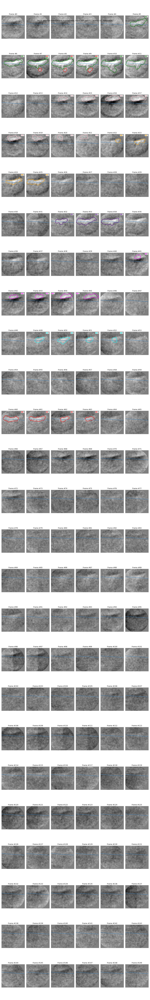

In [10]:
Norm = colors.Normalize(vmax=1, vmin=-1)
nlong=Nt//6
#colors_clust=['b.', 'gv','ko','c+','p.','g.','c.', 'y.', 'b.']
contour_colors=['red', 'green','pink','orange','indigo','fuchsia', 'cyan']
fig, axs = plt.subplots(nlong,6,layout='tight',figsize=(15,nlong*4))
fig.suptitle(f"Wave detection in {condition.capitalize()} {session} data, trial {trial_number} with eps={eps}, MinPts={MinPts}, Theta={int(theta*100)}%")

for k in range(Nt): #plot background
    axs[k//6, k%6].imshow(img.gaussian_filter(np.rot90(test_trial[k],2), sigma=4, mode='constant')*mask, cmap='gray', norm=Norm)
    axs[k//6, k%6].set_title(f'Frame #{k}')
    axs[k//6, k%6].axis('off')
    axs[k//6, k%6].plot([0,248],[85,102], linewidth=2, color='steelblue')

for mc_numb,mc in enumerate(moving_clusters): 
    for i,j in enumerate(mc['trace']):
        x,y = mc['alpha shapes'][i].exterior.xy
        position=np.vstack((Ny-np.array(y),Nx-np.array(x))).T
        mpl_poly = patch.Polygon(position, closed=True, edgecolor=contour_colors[mc_numb%len(contour_colors)], facecolor='none', linewidth=2, label=f'{mc_numb}')
        axs[j//6, j%6].add_patch(mpl_poly)
        axs[j//6, j%6].legend(fontsize='xx-small')